In [1]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import metrics
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.neighbors import KNeighborsClassifier
import warnings
warnings.filterwarnings("ignore",category=FutureWarning)

In [3]:
os.chdir(r"D:\Training\Imarticus\PGA\PGA17\week15\Dataset")

In [4]:
mobile=pd.read_csv("Mobile_data.csv")

In [5]:
mobile

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,Price
0,842,2.2,1,7,0.6,188,2,2,20,756,2549,9,7,19,0
1,1021,0.5,0,53,0.7,136,3,6,905,1988,2631,17,3,7,1
2,563,0.5,2,41,0.9,145,5,6,1263,1716,2603,11,2,9,1
3,615,2.5,0,10,0.8,131,6,9,1216,1786,2769,16,8,11,1
4,1821,1.2,13,44,0.6,141,2,14,1208,1212,1411,8,2,15,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,0.5,0,2,0.8,106,6,14,1222,1890,668,13,4,19,0
1996,1965,2.6,0,39,0.2,187,4,3,915,1965,2032,11,10,16,1
1997,1911,0.9,1,36,0.7,108,8,3,868,1632,3057,9,1,5,1
1998,1512,0.9,4,46,0.1,145,5,5,336,670,869,18,10,19,0


In [6]:
mobile.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 15 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   clock_speed    2000 non-null   float64
 2   fc             2000 non-null   int64  
 3   int_memory     2000 non-null   int64  
 4   m_dep          2000 non-null   float64
 5   mobile_wt      2000 non-null   int64  
 6   n_cores        2000 non-null   int64  
 7   pc             2000 non-null   int64  
 8   px_height      2000 non-null   int64  
 9   px_width       2000 non-null   int64  
 10  ram            2000 non-null   int64  
 11  sc_h           2000 non-null   int64  
 12  sc_w           2000 non-null   int64  
 13  talk_time      2000 non-null   int64  
 14  Price          2000 non-null   int64  
dtypes: float64(2), int64(13)
memory usage: 234.5 KB


In [12]:
mobile[mobile["mobile_wt"]==200]

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time,Price
29,851,0.5,3,21,0.4,200,5,7,1171,1263,478,12,7,10,0
123,1379,1.1,5,36,0.8,200,2,7,538,1376,3426,5,4,17,1
225,1634,1.4,1,17,0.2,200,2,5,964,1677,3031,11,6,6,1
282,1839,1.2,9,54,0.5,200,7,11,475,1493,927,19,10,18,0
438,853,2.0,10,3,0.6,200,2,16,674,740,3701,15,8,8,1
485,1277,3.0,0,41,0.3,200,4,3,902,1090,429,9,4,14,0
516,1039,1.3,0,12,0.8,200,8,0,1428,1827,1619,7,1,10,0
557,1519,2.1,0,32,0.7,200,1,10,168,1239,2912,11,10,15,1
662,1695,0.5,6,46,0.7,200,3,9,1791,1898,446,16,13,15,0
846,1489,2.4,8,32,0.6,200,1,16,172,812,776,7,6,8,0


In [6]:
mobile.describe(percentiles=[0.01, 0.02, .03,.04,.05,.1,.25,.5,.75,.90,.95,.96,.97,.98,.99]).T 

,count,mean,std,min,1%,2%,3%,4%,5%,10%,25%,50%,75%,90%,95%,96%,97%,98%,99%,max
battery_power,2000.0,1238.51850,439.418206,501.0,510.00,524.96,538.97,556.92,570.95,634.9,851.75,1226.0,1615.25,1851.0,1930.15,1946.08,1961.06,1974.00,1987.00,1998.0
clock_speed,2000.0,1.52225,0.816004,0.5,0.50,0.50,0.50,0.50,0.50,0.5,0.70,1.5,2.20,2.7,2.80,2.90,2.90,2.90,3.00,3.0
fc,2000.0,4.30950,4.341444,0.0,0.00,0.00,0.00,0.00,0.00,0.0,1.00,3.0,7.00,11.0,13.00,14.00,15.00,16.00,16.00,19.0
int_memory,2000.0,32.04650,18.145715,2.0,2.00,2.00,3.00,4.00,5.00,7.9,16.00,32.0,48.00,57.0,61.00,62.00,63.00,63.00,64.00,64.0
m_dep,2000.0,0.50175,0.288416,0.1,0.10,0.10,0.10,0.10,0.10,0.1,0.20,0.5,0.80,0.9,1.00,1.00,1.00,1.00,1.00,1.0
mobile_wt,2000.0,140.24900,35.399655,80.0,80.00,82.00,83.00,84.00,86.00,91.0,109.00,141.0,170.00,189.0,196.00,197.00,198.00,199.00,199.00,200.0
n_cores,2000.0,4.52050,2.287837,1.0,1.00,1.00,1.00,1.00,1.00,1.0,3.00,4.0,7.00,8.0,8.00,8.00,8.00,8.00,8.00,8.0
pc,2000.0,9.91650,6.064315,0.0,0.00,0.00,0.00,0.00,0.00,1.0,5.00,10.0,15.00,18.0,20.00,20.00,20.00,20.00,20.00,20.0
px_height,2000.0,645.10800,443.780811,0.0,15.00,30.98,45.97,58.00,70.95,125.9,282.75,564.0,947.25,1285.0,1485.05,1568.04,1618.03,1698.00,1791.01,1960.0
px_width,2000.0,1251.51550,432.199447,500.0,512.99,526.96,542.00,562.00,579.85,661.9,874.75,1247.0,1633.00,1854.0,1929.05,1947.00,1963.00,1974.00,1987.00,1998.0


In [13]:
import pandas_profiling as pp

In [14]:
pp.ProfileReport(mobile)

In [15]:
mobile.columns

Index(['battery_power', 'clock_speed', 'fc', 'int_memory', 'm_dep',
       'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h',
       'sc_w', 'talk_time', 'Price'],
      dtype='object')

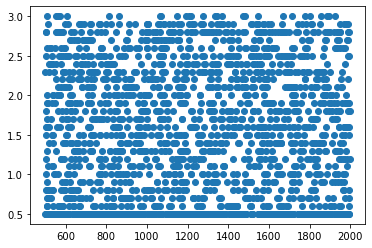

In [16]:
plt.scatter(mobile["battery_power"], mobile["clock_speed"])
plt.show()

In [11]:
# sns.pairplot(mobile)

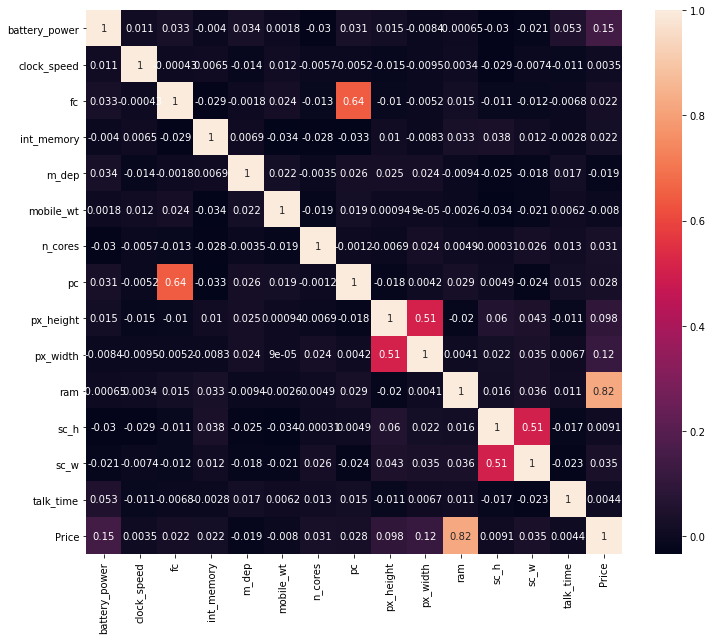

In [18]:
plt.figure(figsize=(12,10))
sns.heatmap(mobile.corr(), annot=True)
plt.show()

In [19]:
y=mobile["Price"]
X=mobile.drop(["Price"], axis=1)

In [20]:
X_train, X_test, y_train , y_test=train_test_split(X, y, test_size=.2, random_state=88)

### Scaling 

In [29]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

scale=MinMaxScaler()

X_train_scaled=scale.fit_transform(X_train)
X_test_scaled=scale.transform(X_test)
# X_train_scaled

In [30]:
pd.DataFrame(X_train_scaled, columns=X_train.columns)

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time
0,0.542112,0.52,0.210526,0.112903,0.333333,0.208333,0.000000,0.30,0.212245,0.540107,0.945946,0.428571,0.555556,0.222222
1,0.032754,0.92,0.000000,0.838710,0.000000,0.766667,0.857143,0.75,0.086224,0.946524,0.309874,0.071429,0.055556,0.944444
2,0.798128,0.48,0.052632,0.177419,0.888889,0.141667,0.285714,0.10,0.091327,0.181818,0.071448,0.000000,0.000000,0.111111
3,0.342914,0.12,0.263158,0.161290,0.444444,0.183333,0.285714,0.70,0.170918,0.119652,0.545090,0.000000,0.055556,0.000000
4,0.440508,0.32,0.000000,0.306452,0.555556,0.383333,1.000000,0.60,0.157143,0.447193,0.824191,0.071429,0.222222,0.666667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1595,0.036765,0.44,0.000000,0.354839,0.444444,0.375000,0.285714,0.00,0.577041,0.544786,0.280706,0.500000,0.444444,0.055556
1596,0.209893,0.00,0.210526,0.193548,0.888889,0.983333,0.285714,0.65,0.076020,0.038770,0.203907,0.857143,0.555556,0.722222
1597,0.985294,0.08,0.210526,0.483871,0.777778,0.758333,0.142857,0.35,0.663776,0.950535,0.921327,0.857143,0.611111,0.611111
1598,0.643048,0.00,0.000000,0.241935,0.666667,0.608333,0.714286,0.40,0.213265,0.562166,0.273214,0.571429,0.333333,0.944444


In [31]:
X_train_scaled=pd.DataFrame(X_train_scaled, columns=X_train.columns)

In [32]:
X_test_scaled=pd.DataFrame(X_test_scaled, columns=X_test.columns)

In [34]:
X_test_scaled.describe()

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time
count,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000,400.000000
mean,0.495749,0.407700,0.224474,0.478024,0.415278,0.507167,0.510357,0.521875,0.312008,0.487279,0.500271,0.535357,0.322639,0.503750
std,0.295726,0.342119,0.226353,0.307036,0.327926,0.295645,0.321107,0.312104,0.222284,0.292131,0.288226,0.307860,0.251549,0.304153
min,-0.000668,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001531,0.000000,0.005887,0.000000,0.000000,0.000000
25%,0.232286,0.040000,0.052632,0.193548,0.111111,0.247917,0.285714,0.250000,0.133929,0.230615,0.256088,0.285714,0.111111,0.277778
50%,0.510695,0.400000,0.157895,0.451613,0.444444,0.512500,0.428571,0.550000,0.265051,0.463904,0.515654,0.571429,0.277778,0.500000
75%,0.735628,0.720000,0.368421,0.758065,0.666667,0.760417,0.857143,0.800000,0.454719,0.747660,0.731937,0.785714,0.500000,0.777778
max,0.998663,1.000000,0.947368,1.000000,1.000000,1.000000,1.000000,1.000000,0.968878,1.001337,1.001338,1.000000,1.000000,1.000000


In [35]:
from sklearn.neighbors import KNeighborsClassifier
knn1=KNeighborsClassifier()
knn1.fit(X_train_scaled, y_train)
print("Train Score :", knn1.score(X_train_scaled, y_train))
print("Test Score :", knn1.score(X_test_scaled, y_test)) 

Train Score : 0.9325
Test Score : 0.86


In [58]:
# help(knn1)

In [51]:
knn1=KNeighborsClassifier(n_neighbors=19,  p=2)
knn1.fit(X_train_scaled, y_train)
print("Train Score :", knn1.score(X_train_scaled, y_train))
print("Test Score :", knn1.score(X_test_scaled, y_test)) 

Train Score : 0.941875
Test Score : 0.9225


In [48]:
knn1=KNeighborsClassifier(n_neighbors=21,  p=3)
knn1.fit(X_train_scaled, y_train)
print("Train Score :", knn1.score(X_train_scaled, y_train))
print("Test Score :", knn1.score(X_test_scaled, y_test)) 

Train Score : 0.934375
Test Score : 0.9


In [ ]:
'+-5%'

In [57]:
k=[]
train_ac=[]
test_ac=[]
for i in range(1,50,2):
    knn2=KNeighborsClassifier(n_neighbors=i)
    knn2.fit(X_train_scaled, y_train)
    
    
    
    print("Result for K==", i)
    
    print("Train Score", knn2.score(X_train_scaled, y_train))
    print("Test Score" ,knn2.score(X_test_scaled, y_test))
    print("--------------------")
    print("\n")
    k.append(i)
    train_ac.append(knn2.score(X_train_scaled, y_train))
    test_ac.append(knn2.score(X_test_scaled, y_test))
          

Result for K== 1
Train Score 1.0
Test Score 0.8025
--------------------


Result for K== 3
Train Score 0.94375
Test Score 0.855
--------------------


Result for K== 5
Train Score 0.9325
Test Score 0.86
--------------------


Result for K== 7
Train Score 0.931875
Test Score 0.88
--------------------


Result for K== 9
Train Score 0.925625
Test Score 0.87
--------------------


Result for K== 11
Train Score 0.93125
Test Score 0.89
--------------------


Result for K== 13
Train Score 0.940625
Test Score 0.9
--------------------


Result for K== 15
Train Score 0.9425
Test Score 0.9075
--------------------


Result for K== 17
Train Score 0.9475
Test Score 0.9075
--------------------


Result for K== 19
Train Score 0.941875
Test Score 0.9225
--------------------


Result for K== 21
Train Score 0.940625
Test Score 0.8975
--------------------


Result for K== 23
Train Score 0.938125
Test Score 0.9
--------------------


Result for K== 25
Train Score 0.9325
Test Score 0.91
--------------------

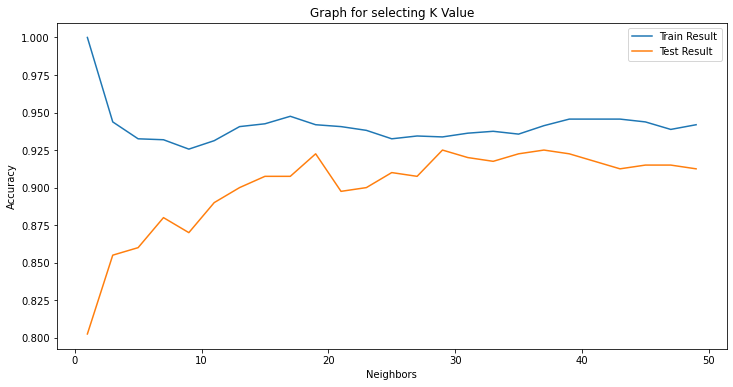

In [65]:
plt.figure(figsize=(12,6))
plt.plot(k, train_ac, label="Train Result")
plt.plot(k, test_ac,label="Test Result")
plt.legend()
plt.title("Graph for selecting K Value")
plt.xlabel("Neighbors")
plt.ylabel("Accuracy")
plt.show() 

In [30]:
k=[]
accuracy_train=[]
accuracy_test=[]
for i in range(1,50,2):
    knni=KNeighborsClassifier(n_neighbors=i)
    knni.fit(X_train_scaled, y_train)
    accuracy_train.append(knni.score(X_train_scaled, y_train))
    accuracy_test.append(knni.score(X_test_scaled, y_test))
    k.append(i)

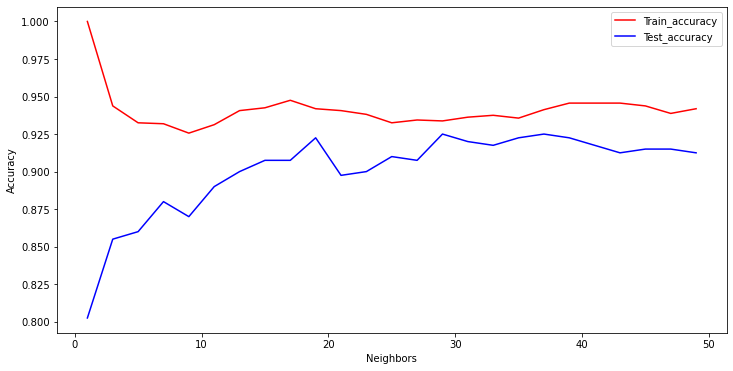

In [36]:
plt.figure( figsize=(12,6))
plt.plot(k, accuracy_train, label="Train_accuracy", color="r")
plt.plot(k, accuracy_test, label="Test_accuracy", color="b")
plt.legend()
plt.xlabel("Neighbors")
plt.ylabel("Accuracy")
plt.show()

In [67]:
knn1=KNeighborsClassifier(n_neighbors=19)
knn1.fit(X_train_scaled, y_train)
print("Train Score :", knn1.score(X_train_scaled, y_train))
print("Test Score :", knn1.score(X_test_scaled, y_test)) 

Train Score : 0.941875
Test Score : 0.9225


In [81]:
knn1=KNeighborsClassifier(n_neighbors=29)
knn1.fit(X_train_scaled, y_train)
print("Train Score :", knn1.score(X_train_scaled, y_train))
print("Test Score :", knn1.score(X_test_scaled, y_test)) 

Train Score : 0.93375
Test Score : 0.925


In [82]:
# Accuracy , recall, precision , F1 score , TPR, FPR, ROC, AUC , Gain, lift , Decile analysis , Ks values

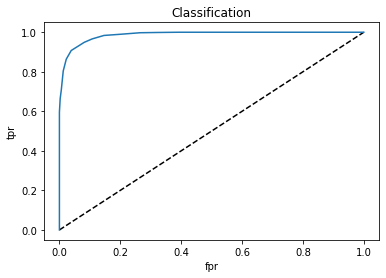

{'Accuracy': 0.93375, 'Recall': 0.9488139825218477, 'Precision': 0.9212121212121213, 'F1_Score': 0.934809348093481, 'FPR': 0.05290322580645161, 'AUC': 0.9864406038134435}


In [128]:
def model_evaluation(X,y, trained_model, name_of_model="Classification"):
    """
    This function will return the performance metrics for classification model 
    i.e. accuracy , recall etc
    """
    from sklearn import metrics
    x1=X.copy()
    y1=y.copy()
    p_y1=trained_model.predict(x1)
    mt=metrics.confusion_matrix(y1, p_y1)
    Accuracy =(mt[0,0]+mt[1,1])/x1.shape[0]
    Recall= mt[1,1]/ ( mt[1,0]+mt[1,1])
    Precision= mt[1,1]/ ( mt[0,1]+mt[1,1])
    F1_Score = (2*Recall*Precision)/ (Recall+Precision)
    FPR=mt[1,0]/ (mt[1,0]+mt[0,0])
    
    probs=trained_model.predict_proba(x1)[:,1]
    
    fpr, tpr, threshold=metrics.roc_curve(y1,probs )
    plt.plot([0,1],[0,1],'k--')
    plt.plot(fpr,tpr)
    plt.title(name_of_model)
    plt.xlabel('fpr')
    plt.ylabel('tpr')
    plt.show()
#     f=pd.DataFrame(performance)
    performance={"Accuracy":Accuracy, "Recall":Recall, 
                 "Precision" :Precision, "F1_Score":F1_Score,
                 "FPR":FPR,
                "AUC":metrics.roc_auc_score(y1,probs)}
    print(performance)
    return performance
d=model_evaluation(X_train_scaled, y_train, knn1)
    

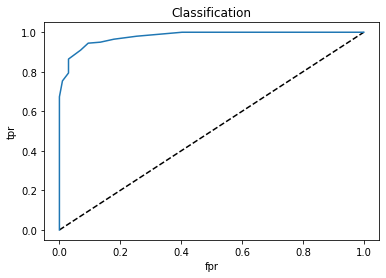

{'Accuracy': 0.925, 'Recall': 0.9447236180904522, 'Precision': 0.9082125603864735, 'F1_Score': 0.9261083743842364, 'FPR': 0.05699481865284974, 'AUC': 0.9787619690492262}


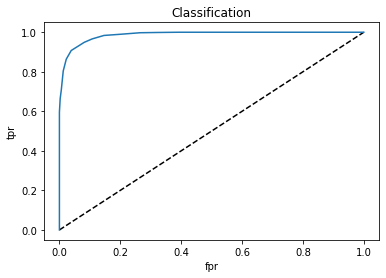

{'Accuracy': 0.93375, 'Recall': 0.9488139825218477, 'Precision': 0.9212121212121213, 'F1_Score': 0.934809348093481, 'FPR': 0.05290322580645161, 'AUC': 0.9864406038134435}


{'Accuracy': 0.93375,
 'Recall': 0.9488139825218477,
 'Precision': 0.9212121212121213,
 'F1_Score': 0.934809348093481,
 'FPR': 0.05290322580645161,
 'AUC': 0.9864406038134435}

In [126]:
model_evaluation(X_test_scaled, y_test, knn1)
model_evaluation(X_train_scaled, y_train, knn1) 

In [109]:
d.keys()

dict_keys(['Accuracy', 'Recall', 'Precision', 'F1_Score', 'FPR'])

In [111]:
d.values()

dict_values([0.93375, 0.9488139825218477, 0.9212121212121213, 0.934809348093481, 0.05290322580645161])

In [ ]:
metrics.precision_score

In [ ]:
FPR= FP/(FP+TN)
TPR= TP/(TP+FN)

In [98]:
mt[1,0]/ (mt[1,0]+mt[0,0])

0.05290322580645161

In [99]:
mt[1,1]/ (mt[1,1]+mt[1,0])

0.9488139825218477

In [95]:
mt

array([[734,  65],
       [ 41, 760]], dtype=int64)

In [92]:
d[1,1]/ ( d[1,0]+d[1,1])

0.9488139825218477

In [73]:
(d[0,0]+d[1,1])/x1.shape[0]

array([[746,  53],
       [ 40, 761]], dtype=int64)

In [91]:
d

array([[734,  65],
       [ 41, 760]], dtype=int64)

In [93]:
d[1,0]

41

In [87]:
?metrics.recall_score

In [74]:
d[1,1]

761

In [39]:
from xgboost import XGBClassifier

In [42]:
xgb1=XGBClassifier(max_depth=4)
xgb1.fit(X_train_scaled, y_train)
print("Train Score :", xgb1.score(X_train_scaled, y_train))
print("Test Score :", xgb1.score(X_test_scaled, y_test))

[12:20:32] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.4.0/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Train Score : 1.0
Test Score : 0.9775


In [43]:
pred_train=xgb1.predict(X_train_scaled)
pred_test=xgb1.predict(X_test_scaled)

In [44]:
print(metrics.classification_report(y_train, pred_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       799
           1       1.00      1.00      1.00       801

    accuracy                           1.00      1600
   macro avg       1.00      1.00      1.00      1600
weighted avg       1.00      1.00      1.00      1600



In [45]:
print(metrics.classification_report(y_test, pred_test))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98       201
           1       0.98      0.97      0.98       199

    accuracy                           0.98       400
   macro avg       0.98      0.98      0.98       400
weighted avg       0.98      0.98      0.98       400



In [46]:
pd.DataFrame({"Var": X_test_scaled.columns, "imp":xgb1.feature_importances_}).sort_values(by=["imp"], ascending=False)

,Var,imp
10,ram,0.613195
0,battery_power,0.112153
9,px_width,0.092501
8,px_height,0.082601
13,talk_time,0.017274
5,mobile_wt,0.013939
11,sc_h,0.013399
1,clock_speed,0.010705
7,pc,0.009854
4,m_dep,0.008260


In [68]:
ne=pd.read_excel("new.xlsx")

In [69]:
ne

,battery_power,clock_speed,fc,int_memory,m_dep,mobile_wt,n_cores,pc,px_height,px_width,ram,sc_h,sc_w,talk_time
0,842,2.2,1,7,0.6,188,2,2,20,756,2549,9,7,19
1,1021,0.5,0,53,0.7,136,3,6,905,1988,2631,17,3,7
2,2000,2.1,1,45,0.8,160,4,6,900,2000,2500,20,6,19


In [72]:
ne1=scale.transform(ne)
ne2=pd.DataFrame(ne1, columns=ne.columns)

In [73]:
knn2.predict(ne2)

array([1, 1, 1], dtype=int64)

In [74]:
y=mobile["Price"]
X=mobile.drop(["Price"], axis=1)